# 2D Sampling and Aliasing 

Properties studied in 1D apply in 2D. The following results can be admitted: 
 - given a regular grid, a sampling of a continuous 2D signal can be modelled as follow:
$$
x_e(t,u) = x(t,u)e(t,u)\quad \text{with}\quad e(t,u) = \sum_{k=-\infty}^{+\infty} \sum_{l=-\infty}^{+\infty} \delta(t-kT_e,u - lT_e)
$$ $e$ is the analog of Dirac comb (also called impulse train) in 2D
 - spectrum of $x_e$ writes:
$$
X_e(f,g) = \frac1{T_e^2}\sum_{k=-\infty}^{+\infty} \sum_{l=-\infty}^{+\infty} X(f-kf_e,g-lf_e)
$$
2D sampling then implies a periodisation of the spectrum for the two dimensions
 - it is possible to reconstruct the original signal from the sampled signal if 2D Shannon condition is verified (band limited signal) with:
$$
x_r (t,u) = \sum_{k=-\infty}^{+\infty} \sum_{l=\infty}^{+\infty} x_e(kT_e,lT_e) \operatorname{sinc}(\pi f_e (t-kT_e)) \operatorname{sinc}(\pi f_e(u - lT_e))\qquad\qquad\qquad\text{(1)}
$$
so called Shannon interpolation.
 
## Aliasing and Windowing of 2D signals
 
Given the following signal:
$$
s_\theta(t,u) = A\cos(2\pi f_0(t\cos\theta + u\sin\theta))
$$
Here an example with $\theta=\frac\pi4$:
<div>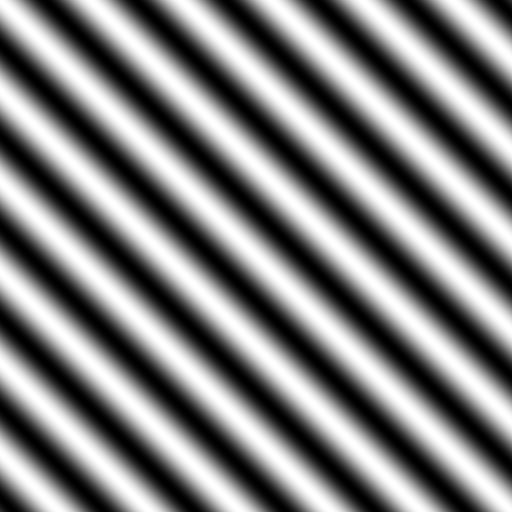</div>
We will see the limit conditions of sampling of this image in order to avoid aliasing.

In [2]:
import numpy as np
from numpy.fft import fft2, fftshift
import matplotlib.pyplot as plt
%matplotlib notebook 
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D

def sinusoid2d(A, theta, size, T0, Te):
    """ double**2*int*double**2 -> Array[double] """
    ct = np.cos(theta/180*np.pi)
    st = np.sin(theta/180*np.pi)
    x, y = np.meshgrid(np.arange(0, size, Te), np.arange(0, size, Te))
    return A*np.cos(2*np.pi*(y*ct - x*st)/T0)

def shannonInterpolation(I, Te, size):
    """ Array*int*double -> Array[double] """
    n, m = I.shape
    x, y = np.meshgrid(np.arange(0, size), np.arange(0, n))
    Y = np.sinc(x/Te-y)
    x, y = np.meshgrid(np.arange(0, size), np.arange(0, m))
    X = np.sinc(x/Te-y)
    return np.matmul(X.T, np.matmul(I, Y))

def imshow(I,title=None):
    """ display an image """
    plt.figure(figsize=(500//80,500//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()

def surf(Z,title=None):
    """ 3D plot of an image """
    X,Y = np.meshgrid(range(Z.shape[1]), range(Z.shape[0]))
    fig = plt.figure(figsize=(600/80,600/80))
    if title: plt.title(title)
    ax = fig.gca(projection='3d')
    ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    plt.show()
    

    

`sinusoid2d(A, theta, L, T0, Te)` allows us to sample signal $s_\theta$ with a sampling period of `Te` (the grid is regular with the sample sampling value for directions $u$ and $t$). Paremeters `A`, `theta`, `L` and `T0` respectively control the amplitude, orientation and period ($T_0=\frac1{f_0}$) of signal $s_\theta$.


<IPython.core.display.Javascript object>


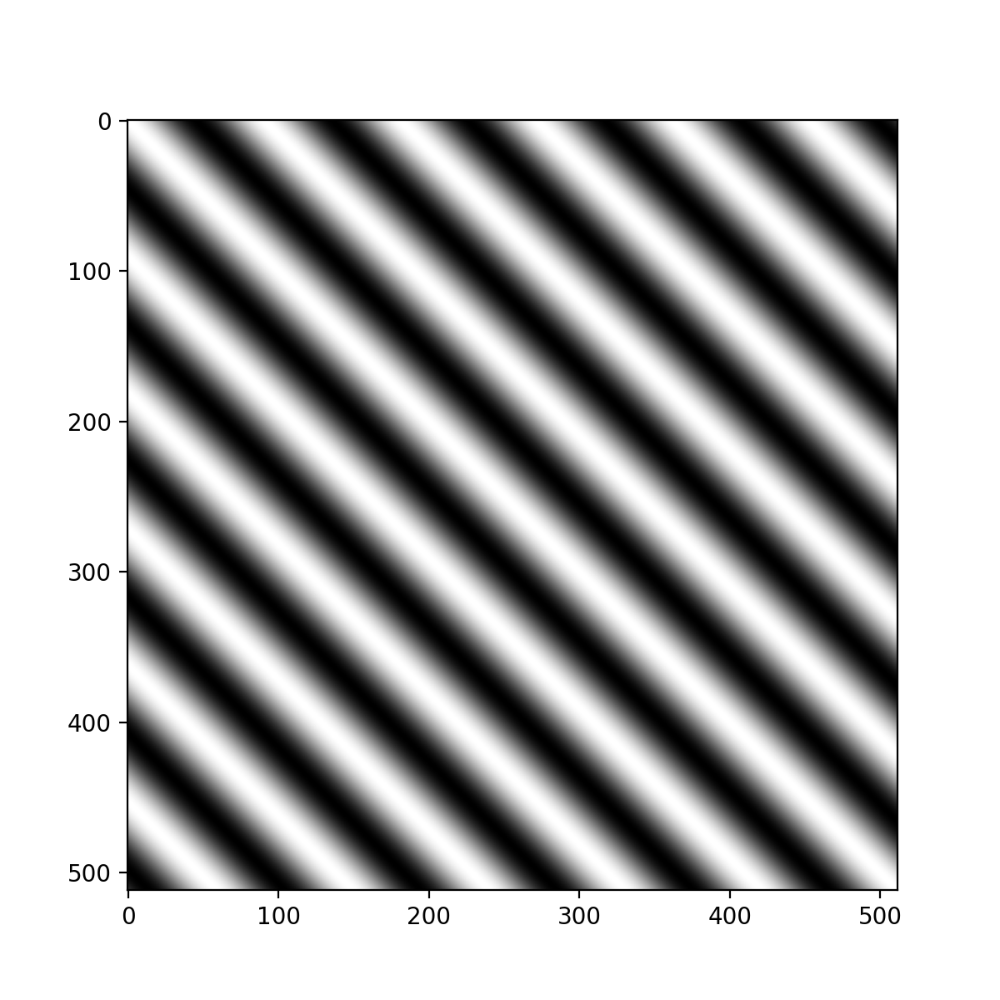

In [3]:
sample = sinusoid2d(1,45,512,64,1)
signal = shannonInterpolation(sample,1,512)
imshow(signal)

We know that we can represent signals with a sum of sines and cosines with different frequencies. All these base signals are continuous signal and needs to be represent as discret. We can achieve that by multiplying our continuous signal with a dirac function. In other words, multiplying each cosine and sine waves with impulse train. So the problem is, if our impulse train doesn't have enough density we wont get enough samples. If we try to reconstruct our continuous signal from this sampled signals, we will see that some informations are lost and the result signal is different from the original signal. This is because of the incorrect sampling, in other words fs < 2fmax. So fmax is our limit frequency because if we sample our signal while fs<2fmax we will not be able to sample correctly all frequencies. the base signals with a frequency bigger than fs/2 will be corrupted and transformed into a lower frequency signal. So this is why fmax is our limit frequency. Because if we have an impulse train for sample highest frequency base signal, this impulse train can also sample other base signals correctly.

Max frequency of s45 for both direction => 1/64



$s_{45}$ with $f_e = 16 f_m$

<IPython.core.display.Javascript object>


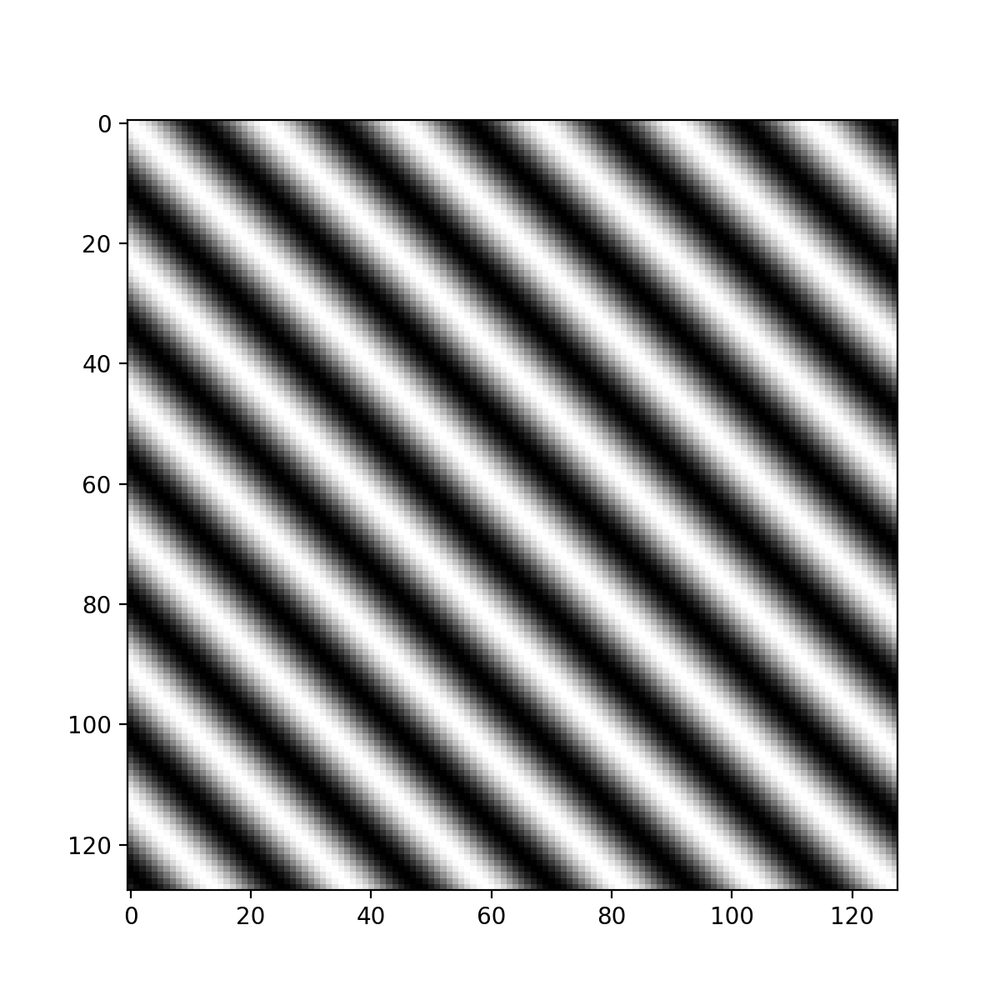

In [4]:
fm = 1/64
fe = 16*fm
sample = sinusoid2d(1,45,512,1/fm,1/fe)
imshow(sample)

Frequencies of the sampled signal by using `surf()` function for an interactive 3D plot.

<IPython.core.display.Javascript object>


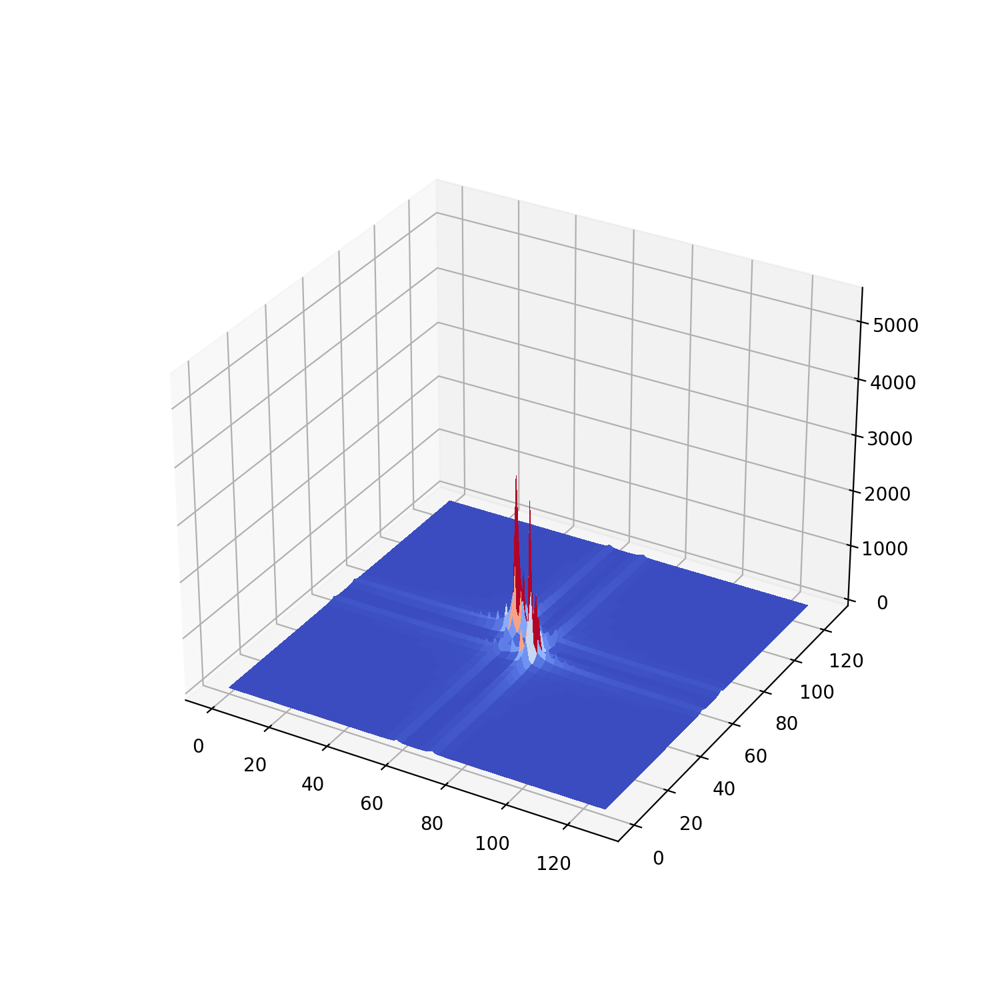

In [12]:
sample = sinusoid2d(1,45,512,1/fm, 1/fe)
surf(np.abs(fftshift(fft2(sample))))

  In order to sample the continuous 2d signal we multiply the signal with a 2d rect function. The fourier transform of a rect function is  a sinc function and the fourier transform of the signal is a dirac function. We take the convolution for sinc and dirac function So this explain the presence of the dirac peaks. The only changes in the spectrum is while we increase Te, grid size is also increase so get more smooth spectrum. While we decrease Te, the grid size is also decrease so get more incorrect spectrum (only midpoint of the grids are true rest of them are interpolations between grids). Comparing with the the spectrum of the continuous signal(s45), the only difference between the spectrum is in continuous signal the results are correct in everywhere of the signal but in the spectrum as we said before, only midpoints of the grids are true rest of them are interpolations between grids.

The origin of these lobes is arms of the 2D sinc function. The origin of this fusion is $f_0$ variable in the formula.
While we increase the $T_0$, $f_0$ is also decrease so Two dirac peaks are getting close to each other.

$s_{45}$ with $f_0=4 f_m$.

<IPython.core.display.Javascript object>


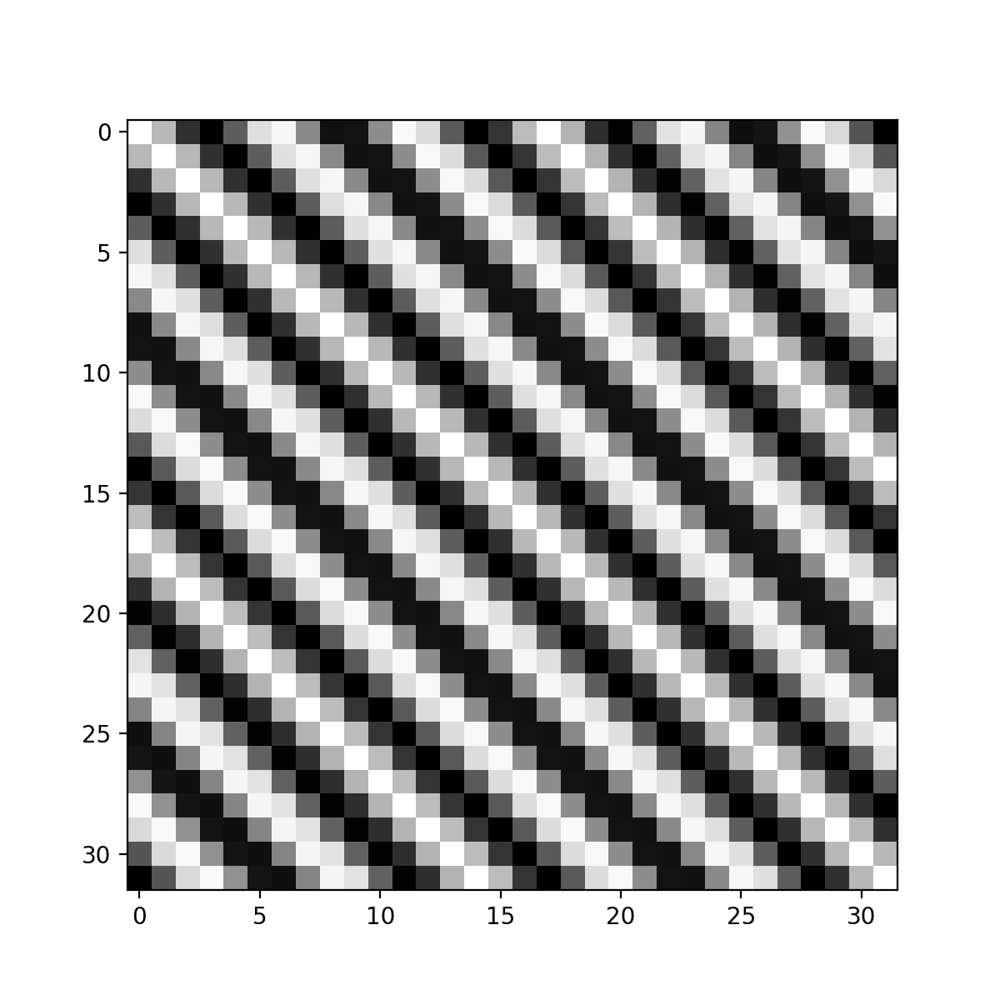

In [13]:
fm = 1/64
fe = 4*fm
sample = sinusoid2d(1,45,512,1/fm,1/fe)
imshow(sample)

Implementing the relative average error $\displaystyle\epsilon_r = \frac 1{2AL^2}\sum_{k=0}^L\sum_{l=0}^L |x_r(k,l)-x_d(k,l)|$ between the original and the reconstructed signal.

In [14]:
import math
def error(A,L,I1,I2):
    temp = 0
    if I1.size>=I2.size:
        for i in np.arange(I1.shape[0]):
            for j in np.arange(I1.shape[1]):
                indiceI = math.floor(i*I2.shape[0]/I1.shape[0])
                indiceJ = math.floor(j*I2.shape[1]/I1.shape[1])
                temp += abs(I1[i][j]-I2[indiceI][indiceJ])
    else:
        for i in np.arange(I2.shape[0]):
            for j in np.arange(I2.shape[1]):
                indiceI = math.floor(i*I1.shape[0]/I2.shape[0])
                indiceJ = math.floor(j*I1.shape[1]/I2.shape[1])
                temp += abs(I1[i][j]-I2[indiceI][indiceJ])
    
    return temp/(2*A*L**2)

Reconstruction of the sampled signal. The origin of this error is loss of information related to Shannon condition.

<IPython.core.display.Javascript object>


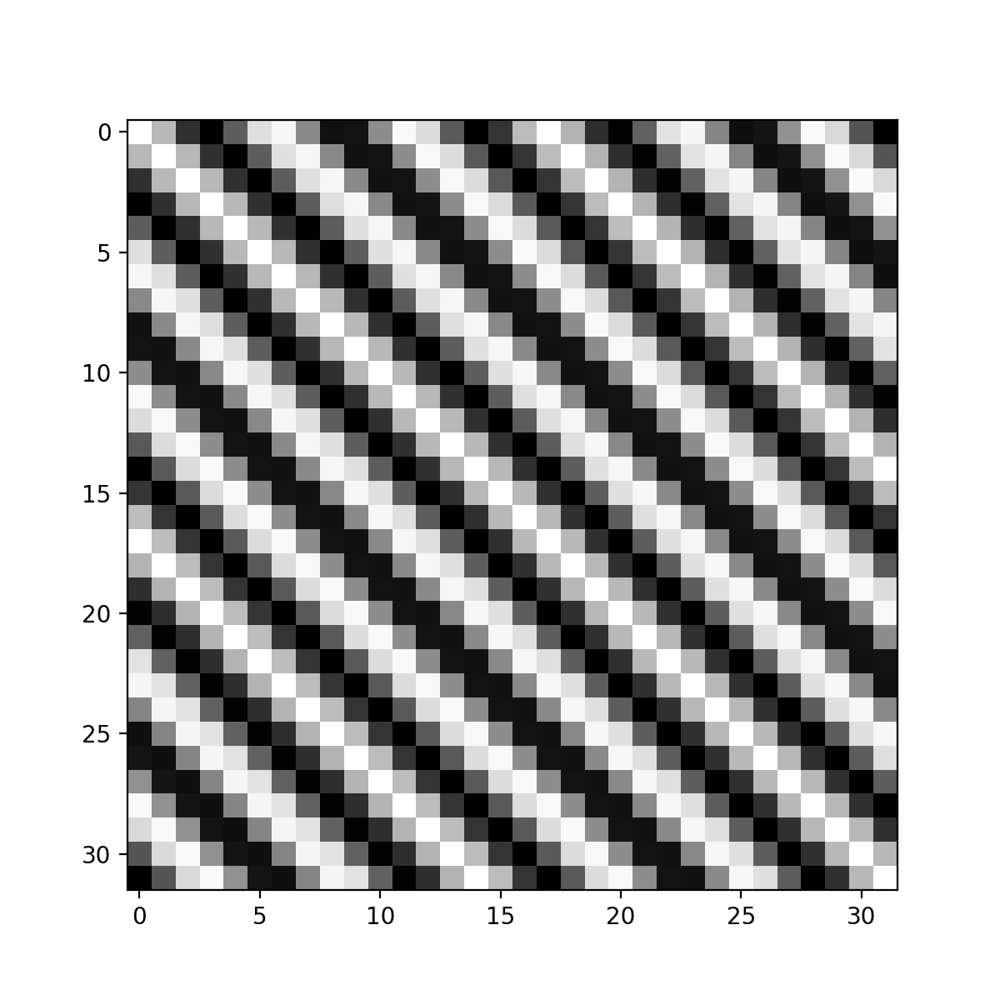

<IPython.core.display.Javascript object>


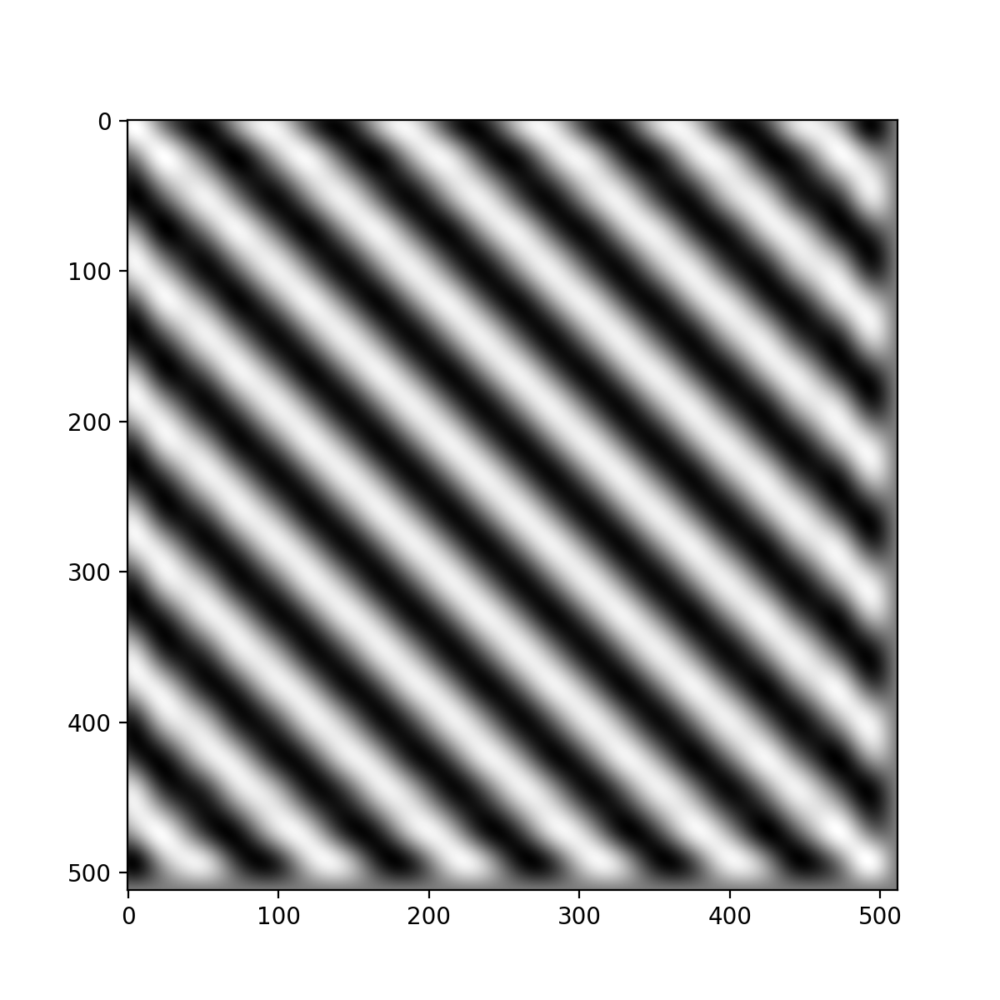

0.12241760748952664


In [15]:
signal = shannonInterpolation(sample,1/fe,512)
imshow(sample)
imshow(signal)
print(error(1,512,signal,sample))

Same scenario with $f_e = \frac32f_m$ and the effects of aliasing.

<IPython.core.display.Javascript object>


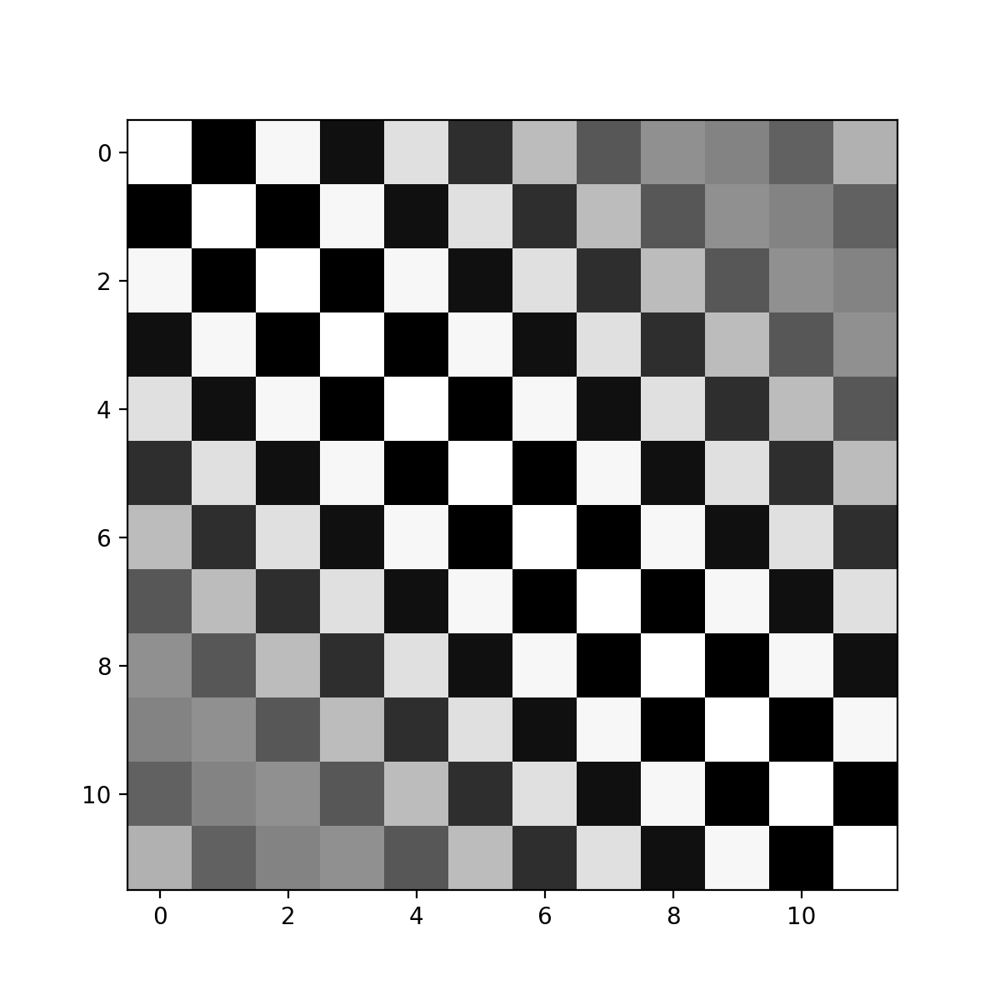

<IPython.core.display.Javascript object>


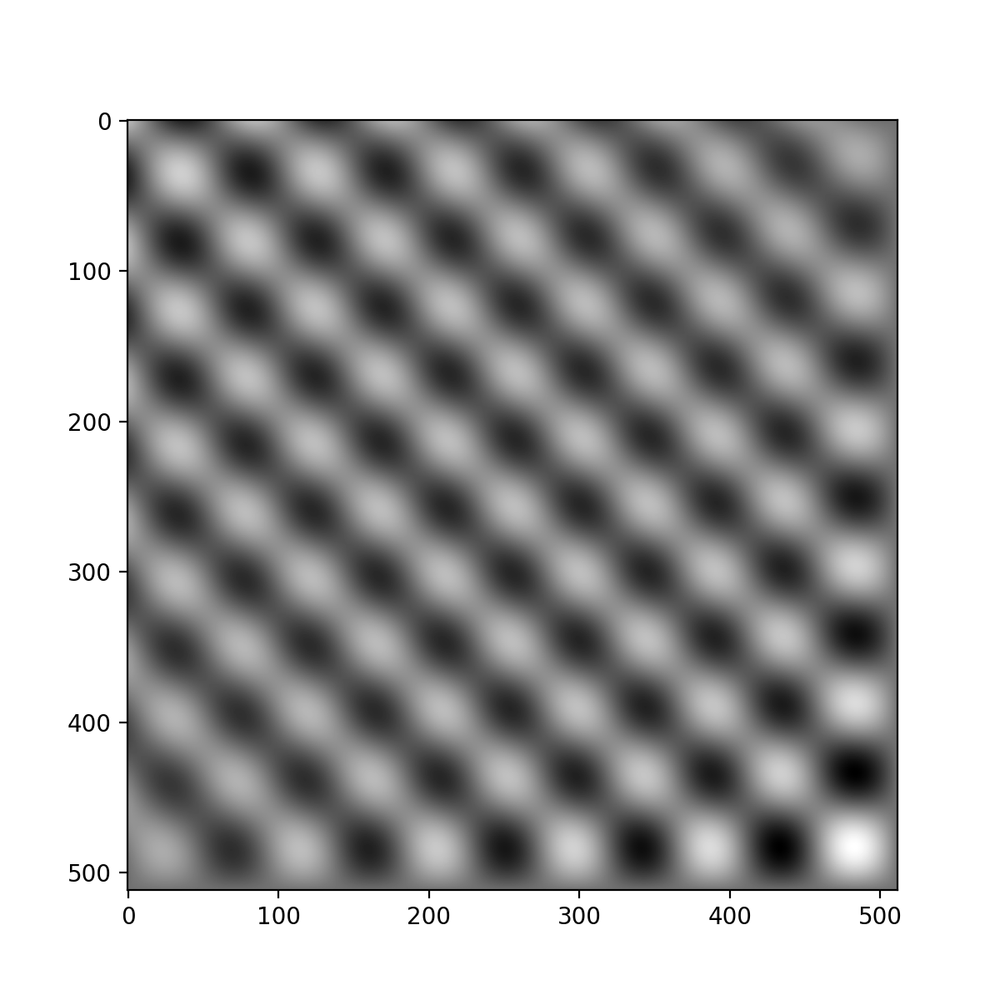

In [16]:
fm = 1/64
fe = 3/2*fm
sample = sinusoid2d(1,45,512,1/fm,1/fe)
imshow(sample)
imshow(shannonInterpolation(sample,1/fe,512))

Let's consider the continuous signal with an oriention of $\theta=10°$.

<IPython.core.display.Javascript object>


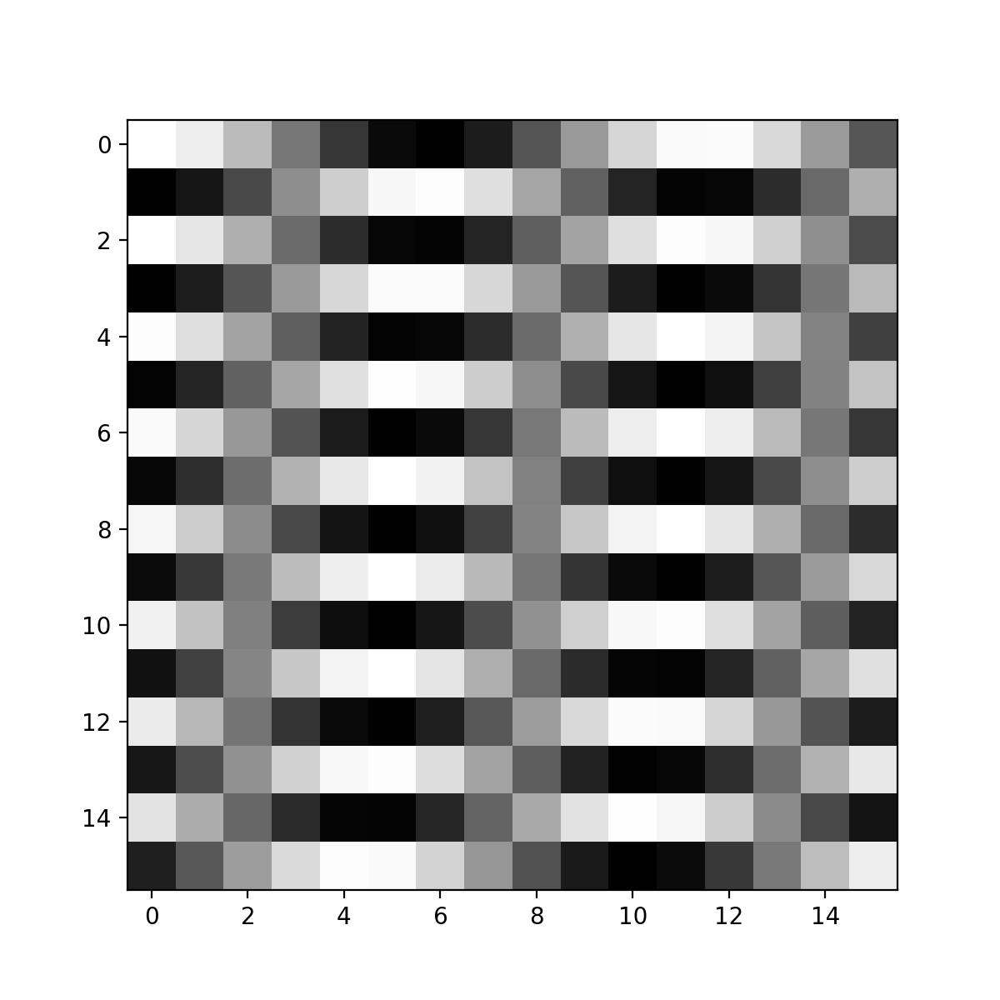

<IPython.core.display.Javascript object>


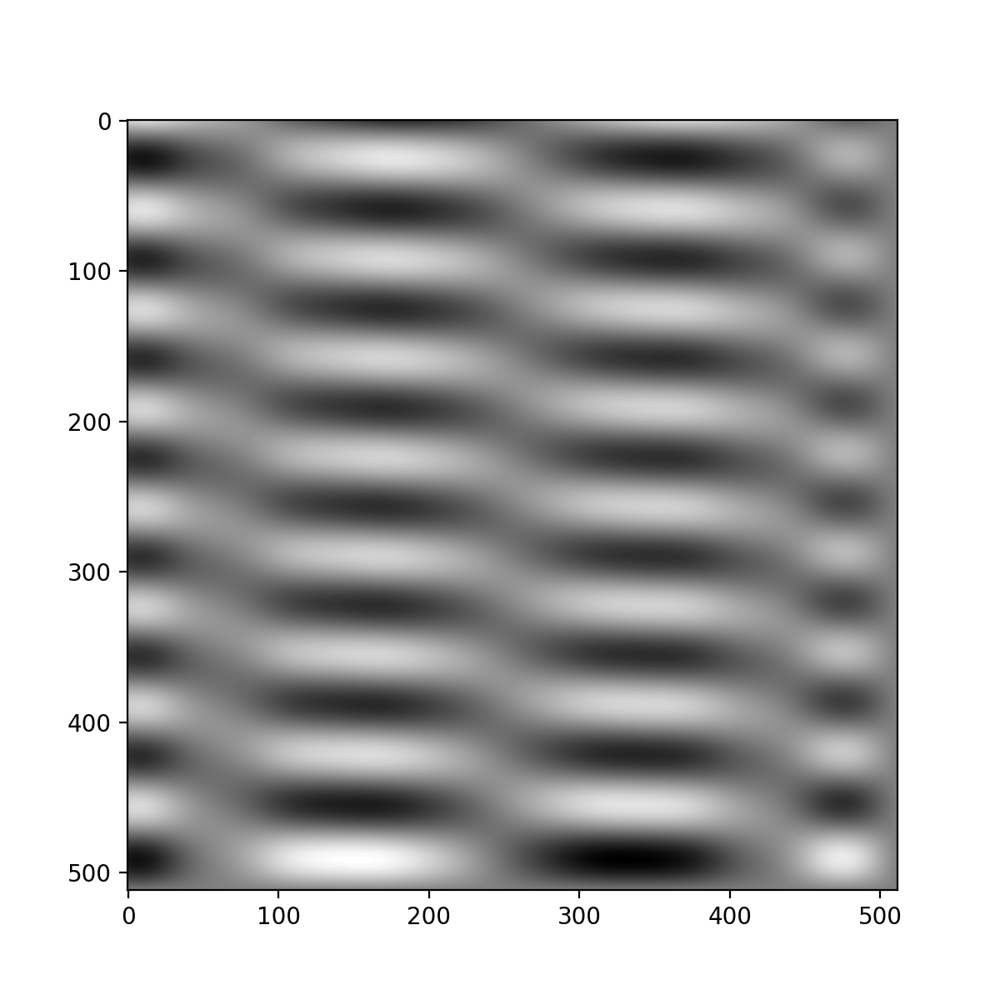

In [18]:
fm = 1/64
fe = 2*fm
sample = sinusoid2d(1,10,512,1/fm,1/fe)
imshow(sample)
imshow(shannonInterpolation(sample,1/fe,512))

Shannon interpolation formula retrieves an incorrect signal: $x_r$ is not equal to $x_a$.


## Aliasing on Natural Images

In this section, we will study aliasing on image `img/barbara.png`. 

In [20]:
from PIL import Image

barbara = np.array(Image.open('img/barbara.png'))

def subSample2(I):
    """ Array -> Array """
    return I[::2,::2]

<IPython.core.display.Javascript object>


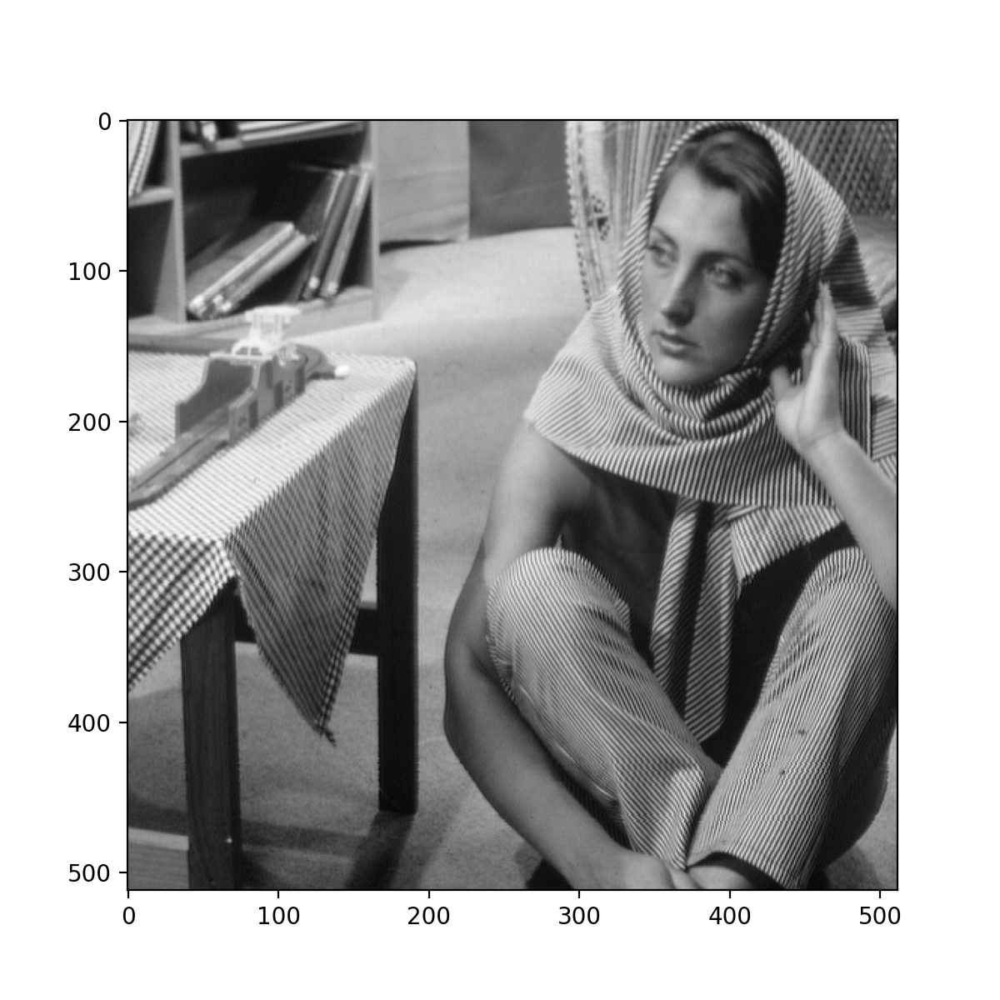

<IPython.core.display.Javascript object>


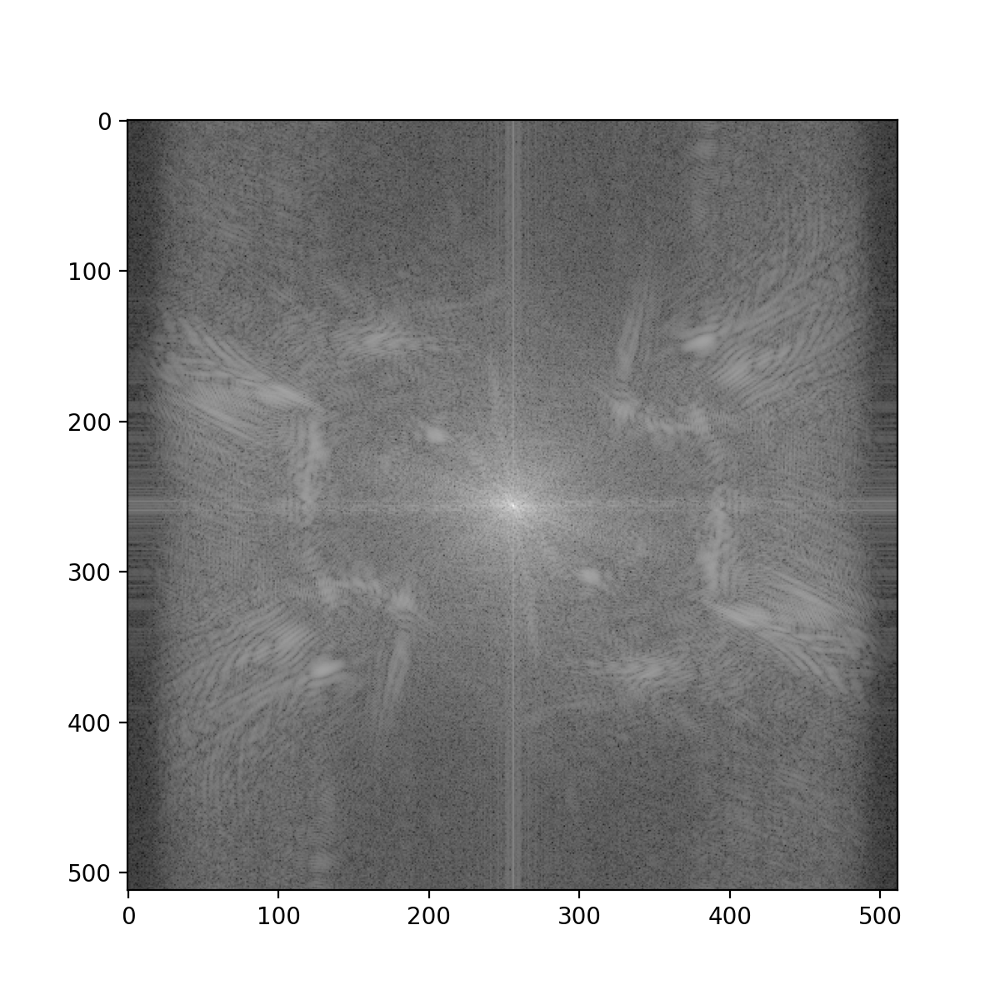

<IPython.core.display.Javascript object>


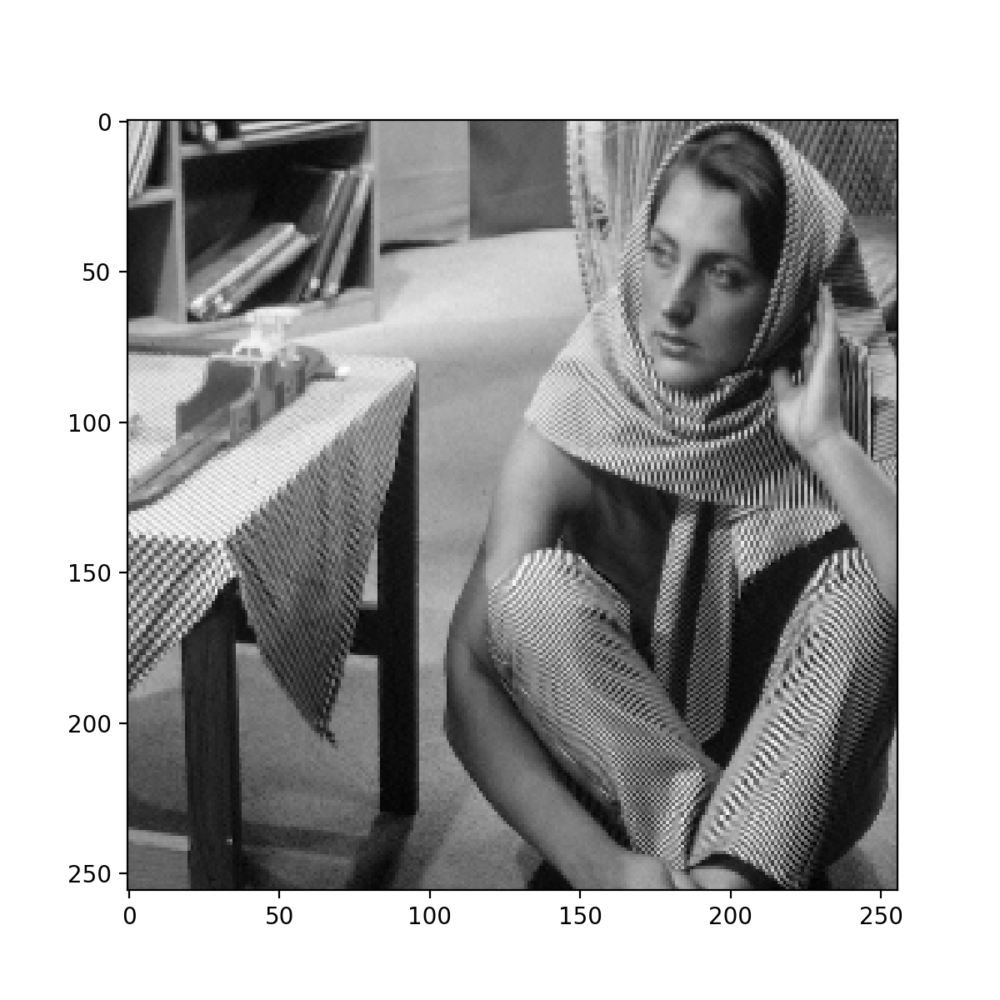

<IPython.core.display.Javascript object>


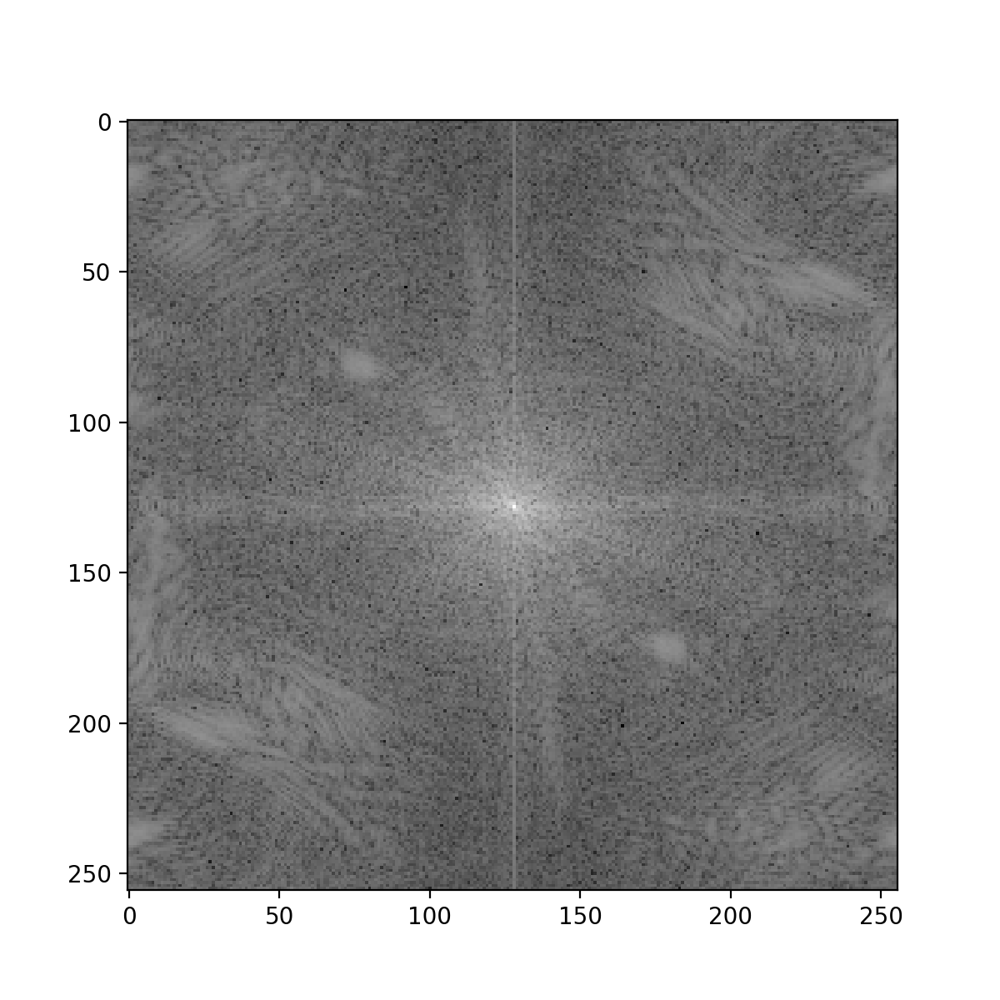

<IPython.core.display.Javascript object>


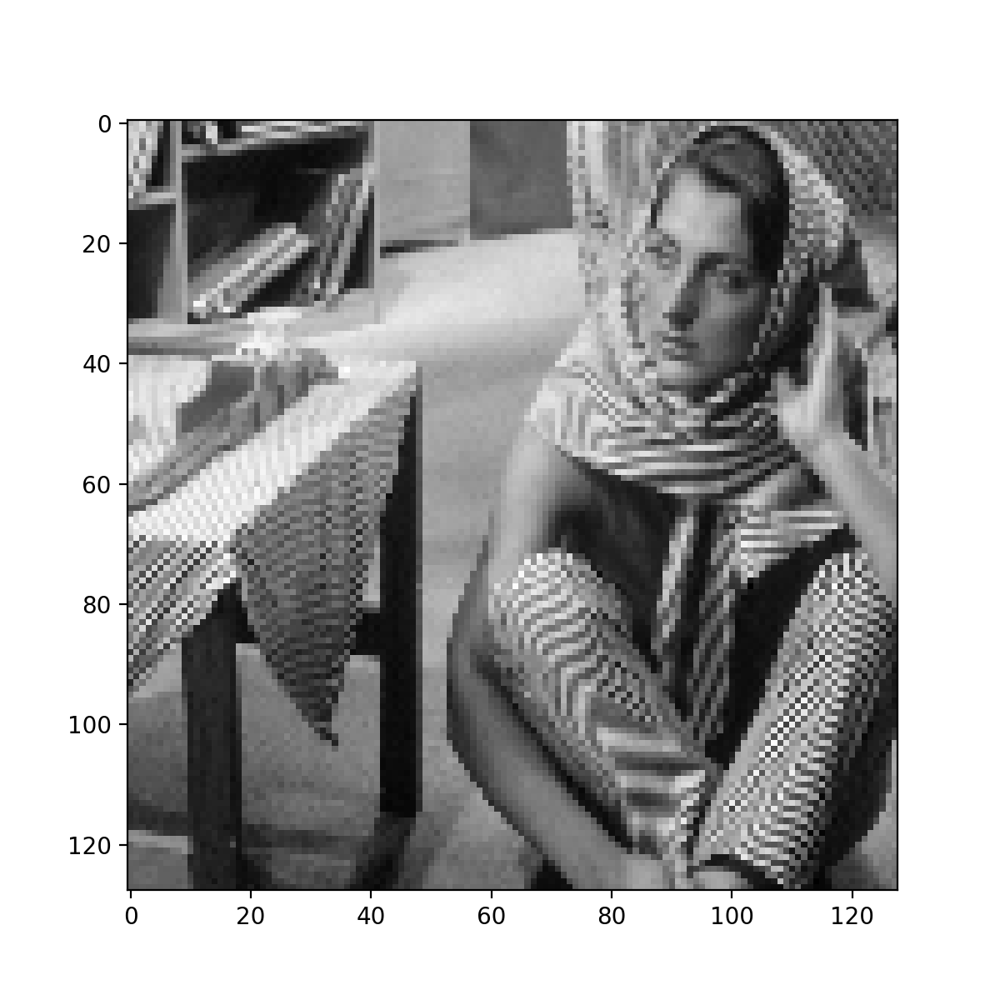

<IPython.core.display.Javascript object>


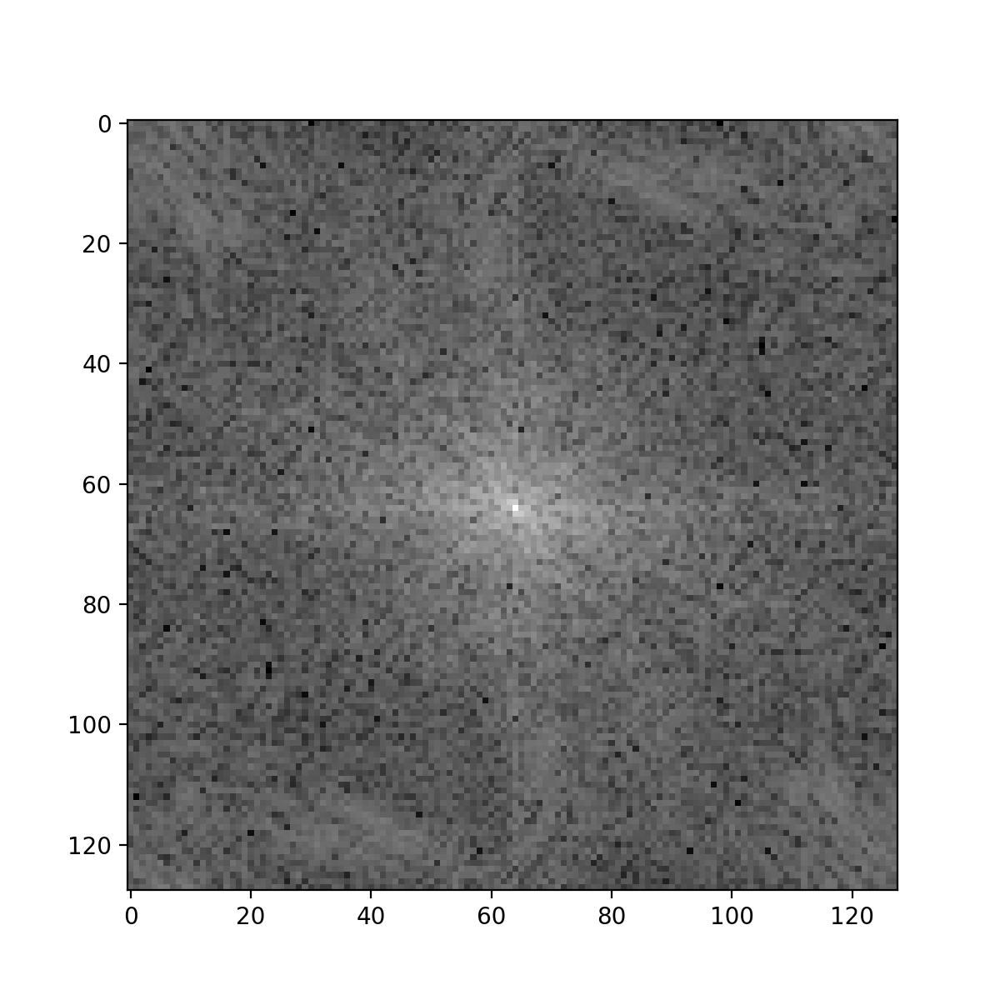

In [22]:
imshow(barbara)
ft = fft2(barbara)
imshow(np.log(1+np.abs(fftshift(ft))))

# iteration 1 
subSampledImage = subSample2(barbara)
imshow(subSampledImage)
ft = fft2(subSampledImage)
imshow(np.log(1+np.abs(fftshift(ft))))

# iteration 2
subSampledImage = subSample2(subSampledImage)
imshow(subSampledImage)
ft = fft2(subSampledImage)
imshow(np.log(1+np.abs(fftshift(ft))))



Subsample of factor 2 is basicly reducing the number of rows and columns by half. The impact on the image is
aliasing. By reducing the image resolution, we also reducing the spatial grid used for projection and this causes
to violation of shannon condition. As a result we obtain aliasing in our image. One of the main aliasing effects is the jaggies on straight lines that are not horizontal or vertical. So if we look at the areas around scarf and knees we can see clearly aliasing occurs more than other areas. If we look at the spectrums after each iteration, high frequencies preserves his existance more than low frequencies.

### Why aliasing is a drawback?

Visually, it's killing the smoothness and it can create a different perception. For example in this particular image, if we look at the second iteration, we can see that the aliasing effect make the scarf look more wrinkled. On the other hand, aliasing can obstruct other applications of image processing. For example, with these aliasing artifacts, it is hard to detect the right edges of the scarf and knees in the second iteration.

Same study with the image `img/mandrill.png`.

<IPython.core.display.Javascript object>


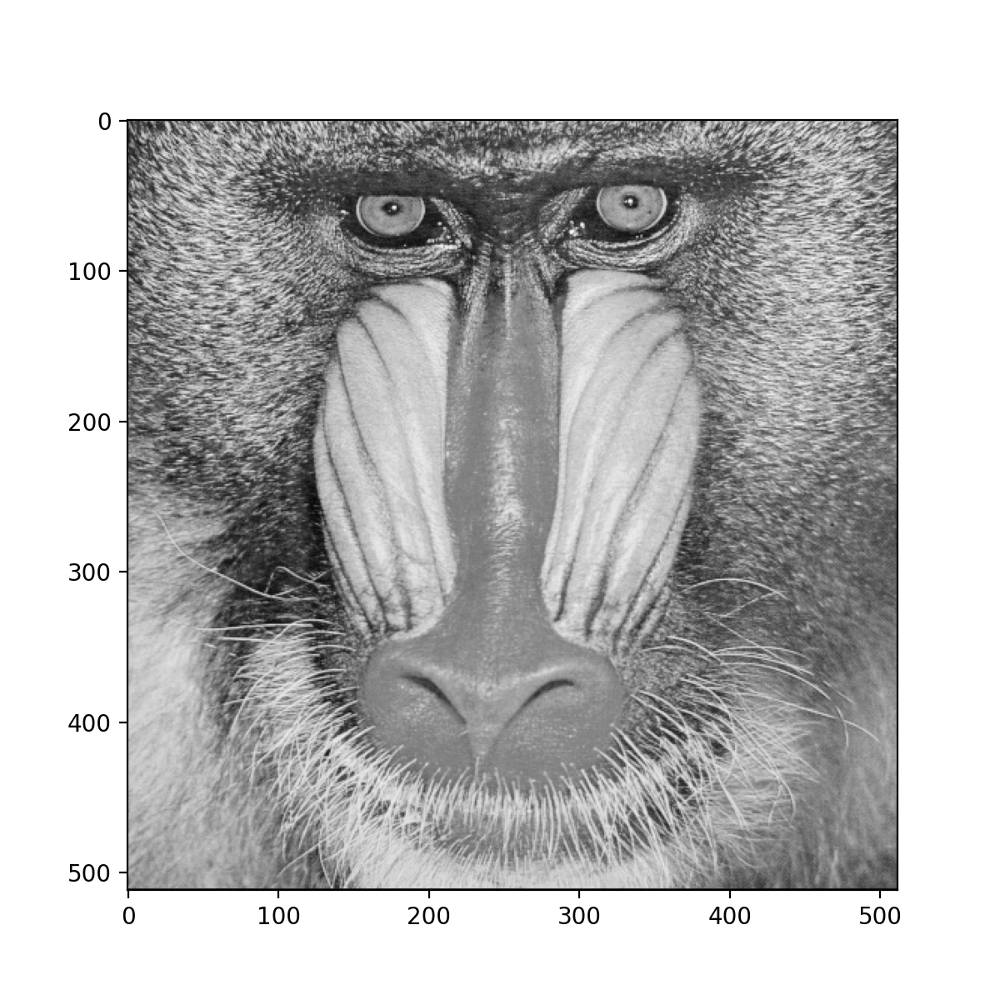

<IPython.core.display.Javascript object>


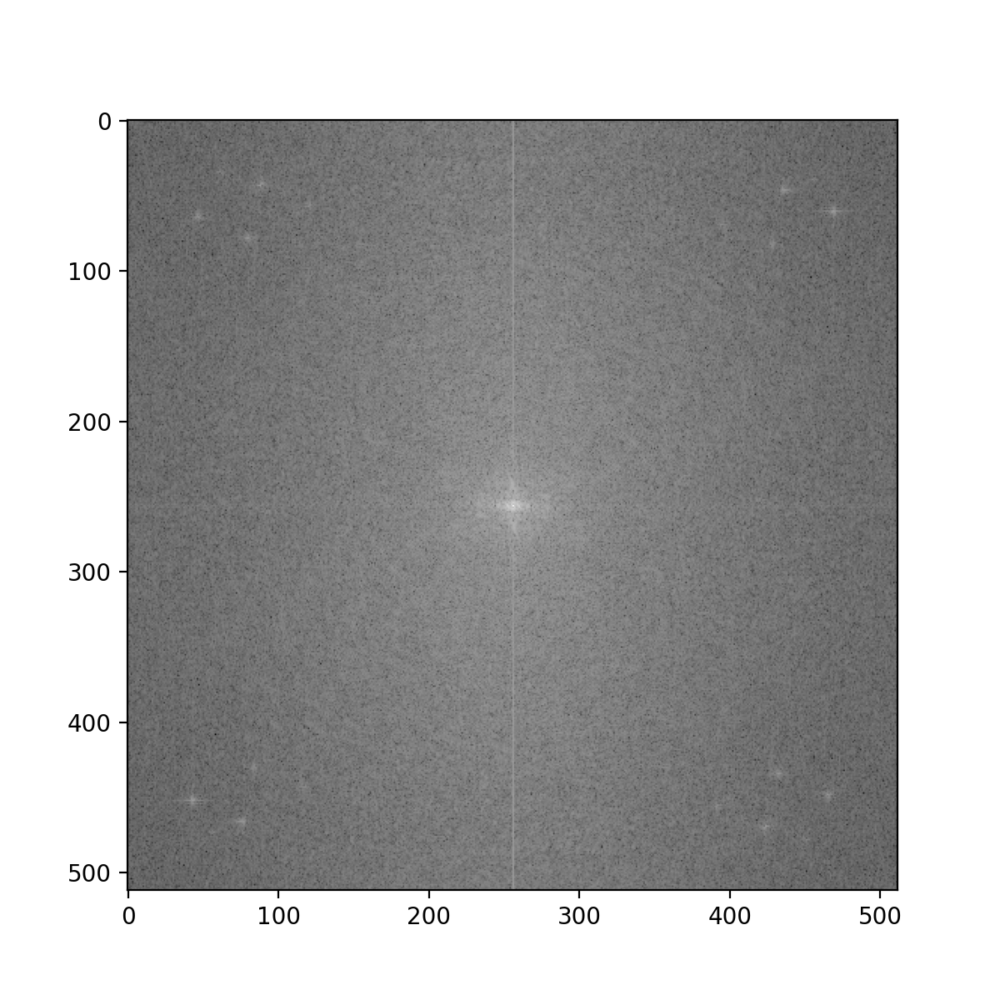

<IPython.core.display.Javascript object>


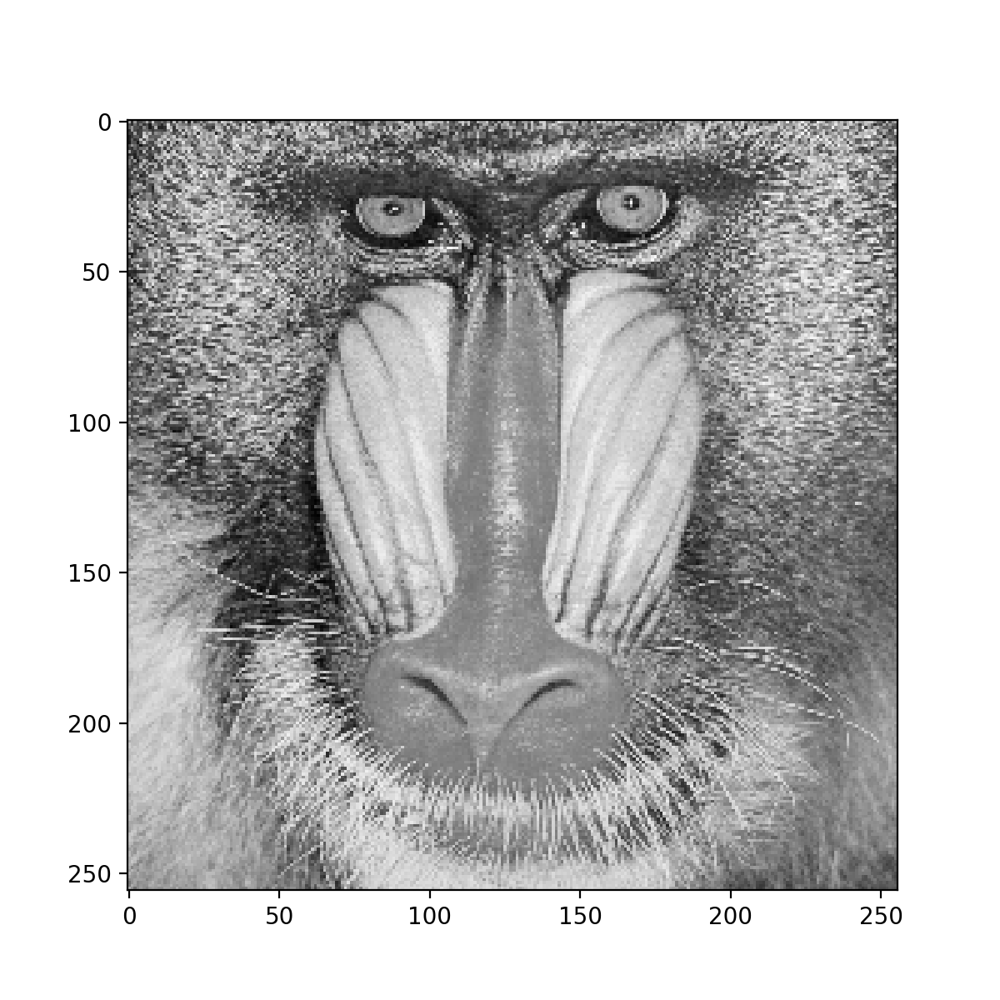

<IPython.core.display.Javascript object>


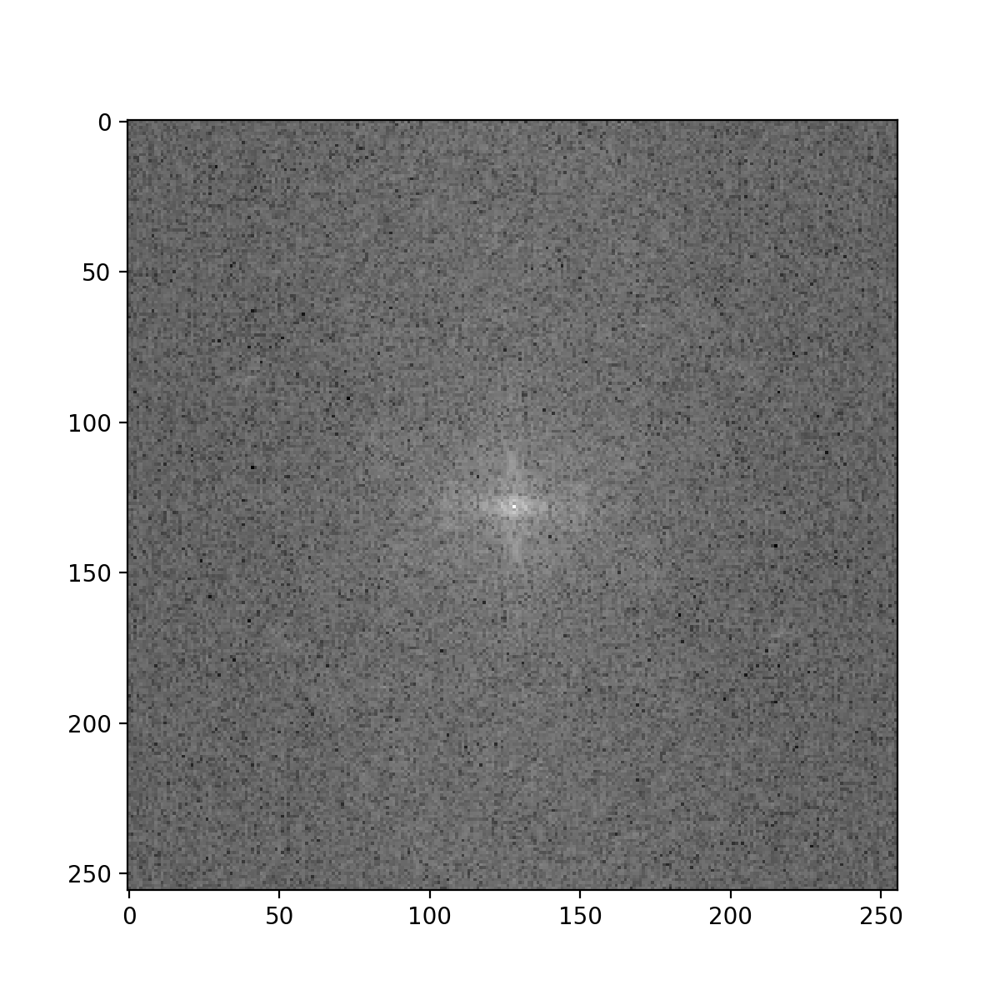

<IPython.core.display.Javascript object>


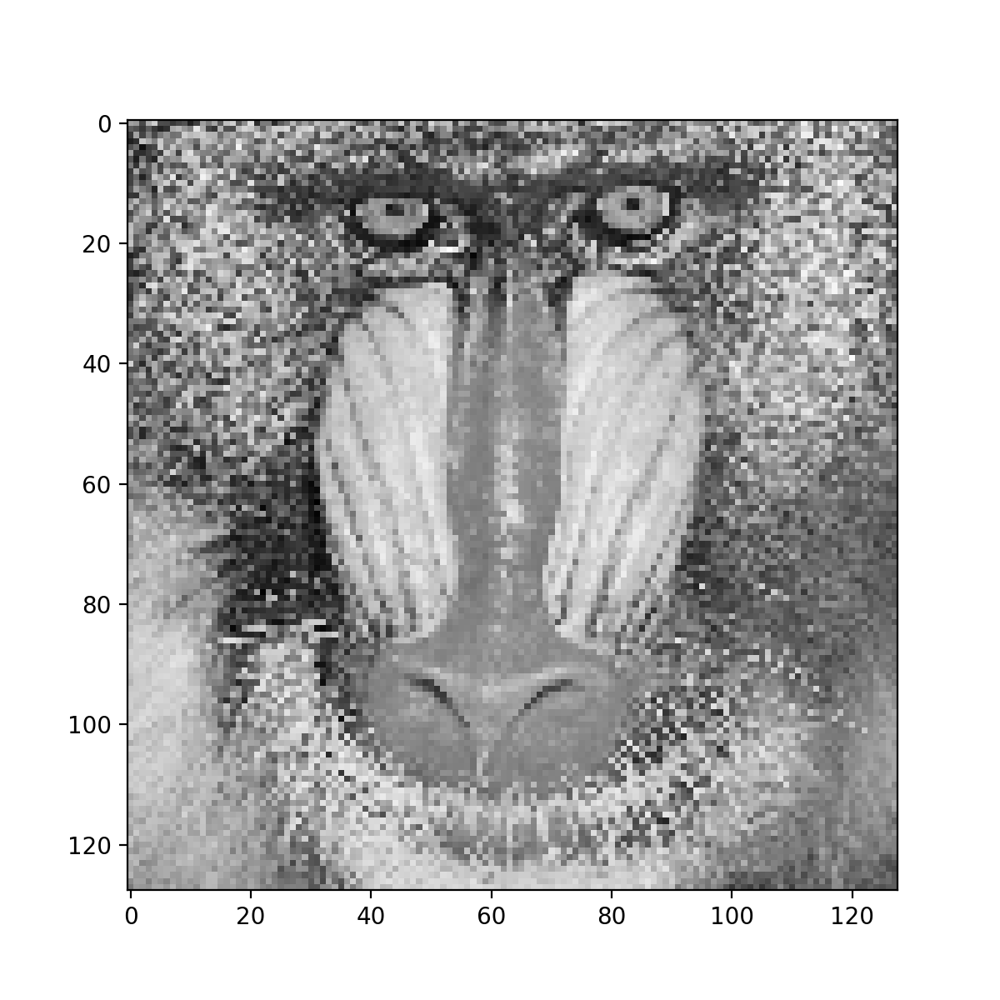

<IPython.core.display.Javascript object>


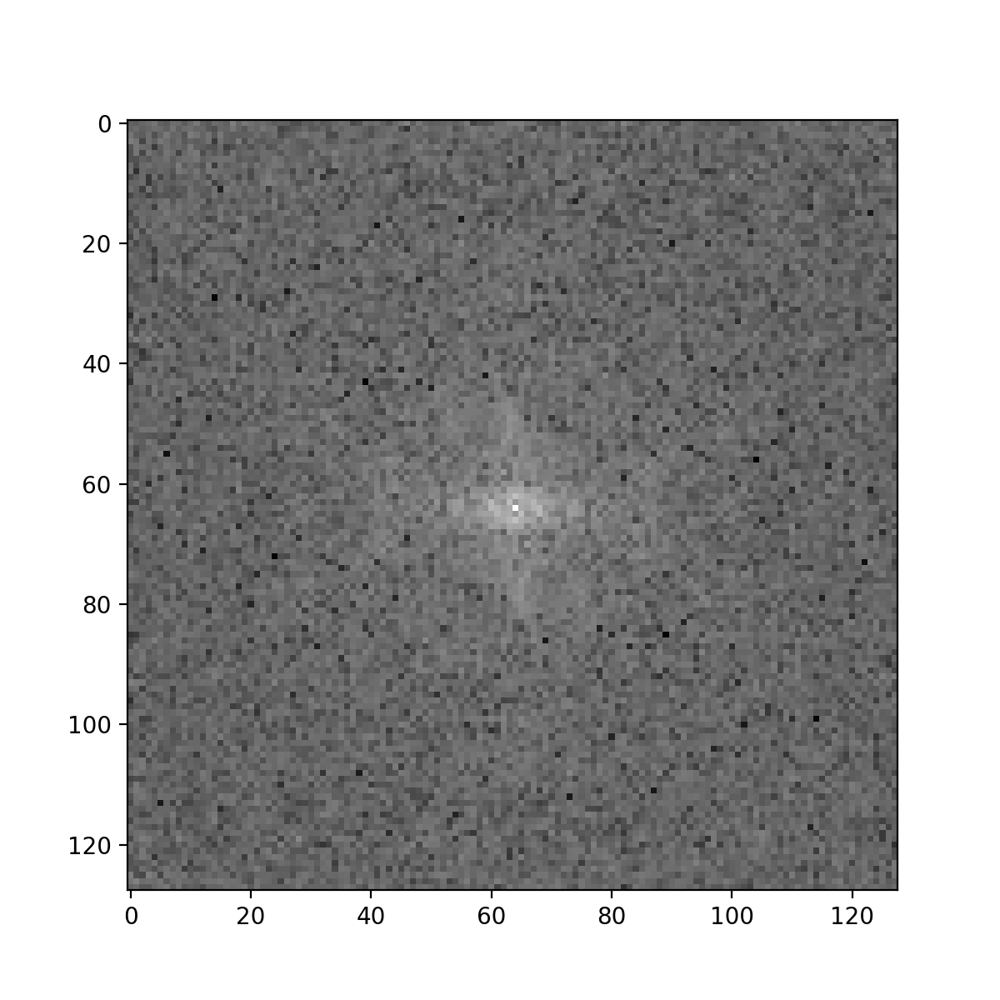

In [23]:
mandrill = np.array(Image.open('img/mandrill.png'))

imshow(mandrill)
ft = fft2(mandrill)
imshow(np.log(1+np.abs(fftshift(ft))))

# iteration 1 
subSampledImage = subSample2(mandrill)
imshow(subSampledImage)
ft = fft2(subSampledImage)
imshow(np.log(1+np.abs(fftshift(ft))))

# iteration 2
subSampledImage = subSample2(subSampledImage)
imshow(subSampledImage)
ft = fft2(subSampledImage)
imshow(np.log(1+np.abs(fftshift(ft))))

In this example aliasing effects is the jaggies on the bristles that are not horizontal or vertical. So if we
look at the areas around bristles and facial hairs we can clearly see aliasing occurs more than other areas. If we
look at the spectrums after each iteration, high frequencies preserves his existance more than low frequencies. We can clearly see that all the facial hairs turn into a noise in the second iteration. So it's corrupting the image visually.